# Basic Graph Analysis


Graphs are described using basic and graph theoretical measures. Distribution of measures across the dataset are plotted.



In [1]:
import warnings
warnings.filterwarnings("ignore")
import networkx as nx
from stanza.server import CoreNLPClient
import os
import os.path as op
import pandas as pd
import sys
sys.path.append(
    '/Users/CN/Documents/Projects/Cambridge/cambridge_language_analysis/')
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import datetime
import glob
import re
import seaborn as sns
import word2vec as w2v
import gensim
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import collections


In [3]:
# SemanticSpeechGraph functions
from compile_graphs_dataset import get_graphs, graph_properties, exclude_empty_graphs
from graph_analysis_functions import print_bidirectional_edges, print_parallel_edges, get_parallel_edges, central_words, calc_vector_distance, calc_vector_distance_adj, choose_representative_word, find_representative_node_words

In [30]:
# --------------------- Import graphs ---------------------------------------
graph_dir = '/Users/CN/Dropbox/speech_graphs/all_tats'

graphs, filelist = get_graphs(graph_dir)
graphs, filelist = exclude_empty_graphs(graphs, filelist, be_quiet=True)
df = graph_properties(graphs, filelist)

print('Imported and described {0} graphs.\n{1} subjects described {2} ± {3} pictures on average.'.format(df.shape[0], len(df.subj.unique()), df.subj.value_counts().mean(), round(df.subj.value_counts().std(),2)))
df.head()

Obtained 1414 graphs. Excluded 11 empty graphs. Kept 1403 graphs.
Imported and described 1403 graphs.
244 subjects described 5.75 ± 2.77 pictures on average.


,subj,tat,words,sentences,nodes,edges,unconnected,average_total_degree,parallel_edges,bidirectional_edges,...,max_degree_centrality,max_degree_node,max_indegree_centrality,max_outdegree_centrality,mean_confidence,std_confidence,density,diameter,average_shortest_path,clustering
0,3138838,10,113,5,16,18,4,2.250000,0,5,...,1.000000,girl,"(girl, 0.4)","(girl, 0.6)",0.515703,0.254636,0.133333,4,2.291667,0.000000
1,3138838,13,129,5,23,20,0,1.739130,0,0,...,0.545455,the men,"(the men, 0.2727272727272727)","(the men, 0.2727272727272727)",0.571675,0.255738,0.079051,5,2.375000,0.118538
2,3138838,30,119,6,21,20,2,1.904762,0,0,...,0.350000,man,"(picture, 0.2)","(man, 0.30000000000000004)",0.501676,0.232276,0.095238,7,3.204678,0.013033
3,3138849,10,71,3,13,12,3,1.846154,1,0,...,0.250000,bread,"(bread, 0.25)","(it, 0.25)",0.768180,0.198013,0.141026,5,2.333333,0.000000
4,3138849,13,97,7,25,20,1,1.600000,0,0,...,0.208333,it,"(bit, 0.08333333333333333)","(it, 0.20833333333333331)",0.497572,0.245393,0.066667,4,2.266667,0.000000


In [7]:
# # --------------------- Print nodes and edges ---------------------------------------
# for G in graphs:
#     print('Nodes: {} \t Edges: {}'.format(len(G.nodes()), G.size()))

In [8]:
# --------------------- Calculate central node word2vec distance ---------------------------------------
df['distance'] = np.nan
frequent_words = []
# Initialise Word2Vec model
model = w2v.load('word2vec_data/text8.bin')
for tat in df.tat.cat.categories:
    most_frequent_word, tat_words_filtered = central_words(df, tat)
    frequent_words.append(most_frequent_word)
    # ---- Calculate distance between to most frequent word for all words ---
    distance = calc_vector_distance(
        most_frequent_word, tat_words_filtered, model)
    row_indices = df.index[df.tat == tat].tolist()
    df.loc[row_indices, 'distance'] = distance

Word is not in word2vec vocabulary: therell. Setting distance as nan.
Word is not in word2vec vocabulary: ladys. Setting distance as nan.
Word is not in word2vec vocabulary: tought. Setting distance as nan.
Word is not in word2vec vocabulary: houswife. Setting distance as nan.
Word is not in word2vec vocabulary: guyc. Setting distance as nan.
Word is not in word2vec vocabulary: someth. Setting distance as nan.
Word is not in word2vec vocabulary: everyones. Setting distance as nan.
Word is not in word2vec vocabulary: someth. Setting distance as nan.
Word is not in word2vec vocabulary: lamppost. Setting distance as nan.
Word is not in word2vec vocabulary: bhadow. Setting distance as nan.


In [9]:
# Currently not working: CoreNLP tries to run on port 9000, but port 9000 is already taken up by jupyter kernel. Setting jupyter to different port does not fix the issue and neither does setting CoreNLP port to a different value. This problem appears in several github issues, but none of the suggested fixes has worked so far.

# # # --------------------- Calculate word2vec distance between adjacent nodes (distance_mean) --------------
# df['distance_mean'] = np.nan
# # # Initialise Word2Vec model
# model = w2v.load('word2vec_data/text8.bin')
# #
# # --- Find representative word in every node ---
# # concatenate node words of every graph, with graphs seperated by \n\n to be split into seperate sentences by CoreNLP
# nodes_allGraphs = ''
# for G in graphs:
#     nodes = list(G.nodes())
#     nodes = (' ').join(nodes)
#     nodes_allGraphs = nodes_allGraphs + nodes + '\n\n'
# #
# # part-of-speech tag node words
# with CoreNLPClient(properties={'annotators': 'tokenize,ssplit,pos,lemma', 'ssplit.newlineIsSentenceBreak': 'two'}, be_quiet=False) as client:
#     doc = client.annotate(nodes_allGraphs)
# #
# # If corenlp server fails and error says
# #   "Error: unable to start the CoreNLP server on port 9000"
# # Then find out the process ID that is occupying port 9000
# #  lsof -i :9000
# # And kill the process using the PID
# #  kill -9 PID
# # (for example kill -9 2269)
# # or all in one command:
# # kill -9 $(lsof -i:9000 | grep python3.7 | awk '{print $2}' | uniq)

# # Get dictionary with one representative words for every node entry on the basis of pos tags
# representative_node_words = find_representative_node_words(
#     graphs, doc, quiet=False)
# #
# # ---- Calculate distance between all adjacent nodes in graph ---
# for g, G in enumerate(graphs):
#     distance = calc_vector_distance_adj(
#         G, model, representative_node_words, quiet=False)
#     df['distance_mean'][g] = distance

In [10]:

# # ----------- Plot -----------
# fig = plt.figure(figsize=(25, 9))
# plt.suptitle('Mean word2vec distance of all adjacent nodes', fontsize=15)
# ax = plt.subplot(1, 2, 1)
# sns.stripplot(y='distance_mean', x='tat',
#               data=df,
#               palette="colorblind",
#               )
# ax = plt.subplot(1, 2, 2)
# plt.hist(df.distance_mean, bins=100)
# plt.grid(axis='y', alpha=0.75)
# plt.ylabel('Frequency', fontsize=15)
# plt.xticks(fontsize=15)
# # output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
# # output = op.join(output_dir, 'Hist_all_vector_distances' +
# #                  '_{0}'.format(str(datetime.date.today())))
# # plt.savefig(output)
# plt.show()

In [11]:
# ----------- How many parallel edges? -----------
print('{0:f} % have at least one parallel edge. Mean number of parallel edges that are parallel in those: {1:f}'.format(
    len(df[df.parallel_edges > 0]) / len(df) * 100, df[df.parallel_edges > 0].parallel_edges.mean()))

43.549537 % have at least one parallel edge. Mean number of parallel edges that are parallel in those: 1.456628


In [12]:
# ----------- Print Parallel edges -----------

# Print parallel edges
for G in graphs:
    print_parallel_edges(G, quiet=True)

# Get parallel edges (where the sentence matches)
list_of_all_pes = []
for G in graphs:
    parallel_edges = get_parallel_edges(G, same_sentence=True)
    list_of_all_pes.append(parallel_edges)

# Construct dataframe from all collected parallel edges
all_pes = pd.DataFrame(columns=['transcript', 'sent', 'n1', 'relation', 'n2'])
all_pes_df = pd.concat(list_of_all_pes)
all_pes_df.head()

# --- Optional: Save df as csv and manually check parallel edge validity ---
# all_pes_df.to_csv(
#     '/Users/CN/Dropbox/speech_graphs/all_tats/output/parallel_edges.csv')
# --> Manual check of parallel edges suggests majority of parallel edges are valid

,transcript,sent,n1,relation,n2
0,3138849-TAT10,2,it,to portray,development
1,3138849-TAT10,2,it,has been,development
0,3138849-TAT30,11,man,smoking,cigarette
1,3138849-TAT30,11,man,could be standing,cigarette
2,3138883-TAT30,4,i,can not make out,it


In [13]:
# ----------- Print bidirectional edges -----------
bidirectional_edges = []
for g, G in enumerate(graphs):
    # Get bidirectional edges
    n_bidirectional_edges = print_bidirectional_edges(G, quiet=True)
    bidirectional_edges.append(n_bidirectional_edges)
    # --> All bidirectional edges seem to be valid

In [14]:
total_bidirectional_edges = [n for n in bidirectional_edges if n is not None and n is not 0]
# ----------- How many parallel edges? -----------
print('{0:f} % have at least one parallel edge. Mean number of parallel edges that are parallel in those: {1:f}'.format(
    len(total_bidirectional_edges) / len(bidirectional_edges) * 100, sum(total_bidirectional_edges)/len(total_bidirectional_edges)))

63.934426 % have at least one parallel edge. Mean number of parallel edges that are parallel in those: 2.202899


# Plots

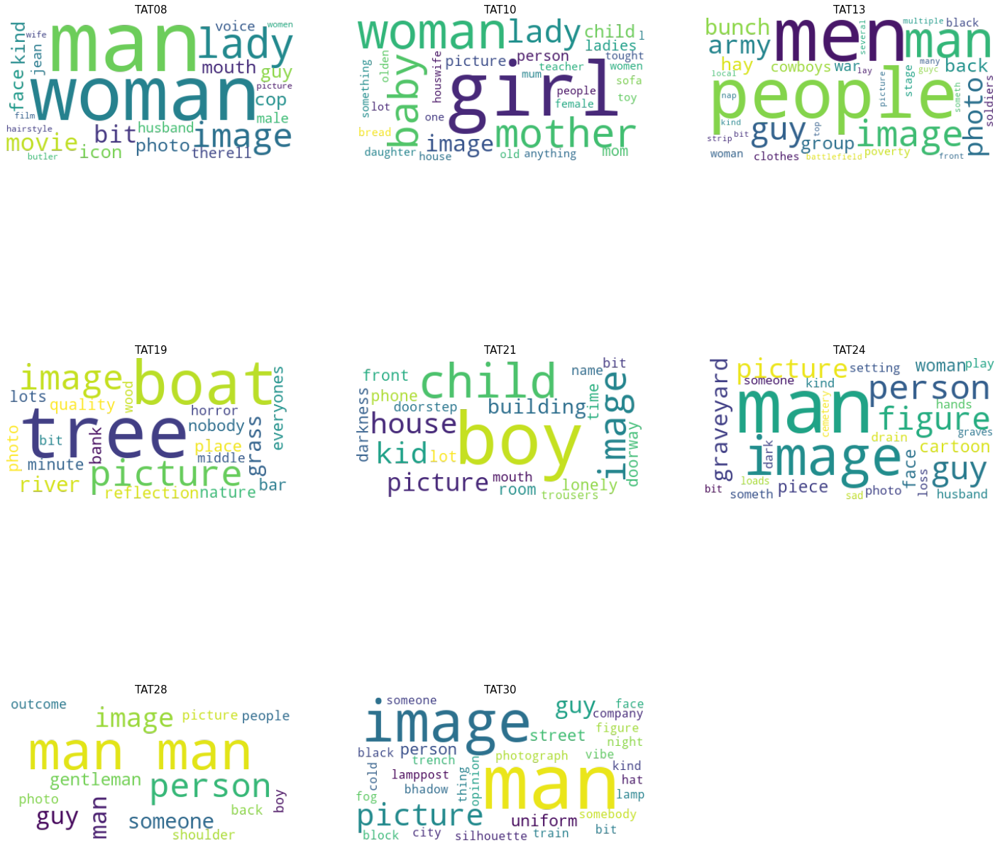

In [17]:
# --------------------- Word clouds ---------------------------------------
fig = plt.figure(figsize=(25, 25))

n_subplots = len(df.tat.cat.categories)
n_cols_subplots = np.ceil(np.sqrt(n_subplots))
n_rows_subplots = np.ceil(n_subplots / n_cols_subplots)
for t, tat in enumerate(df.tat.cat.categories):
    tat_words = df.query('tat == @tat').max_degree_node
    # ---- Get the most frequent word ---
    stop_words = ['the']
    filtered_words = []
    for i, words in enumerate(tat_words):
        # if len(words[0]) > 1
        for word in words.split(' '):
            filtered = []
            if word not in stop_words:
                filtered.append(word)
            all_filtered = (' ').join(filtered)
        filtered_words.append(all_filtered)
    #
    # print(filtered_words)
    tat_words_joined = (' ').join(filtered_words)
    ax = plt.subplot(n_rows_subplots, n_cols_subplots, t + 1)
    wordcloud = WordCloud(background_color=None,
                          mode="RGBA").generate(tat_words_joined)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title('TAT' + tat, fontsize=15)
    plt.axis("off")

output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'WordClouds_' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()

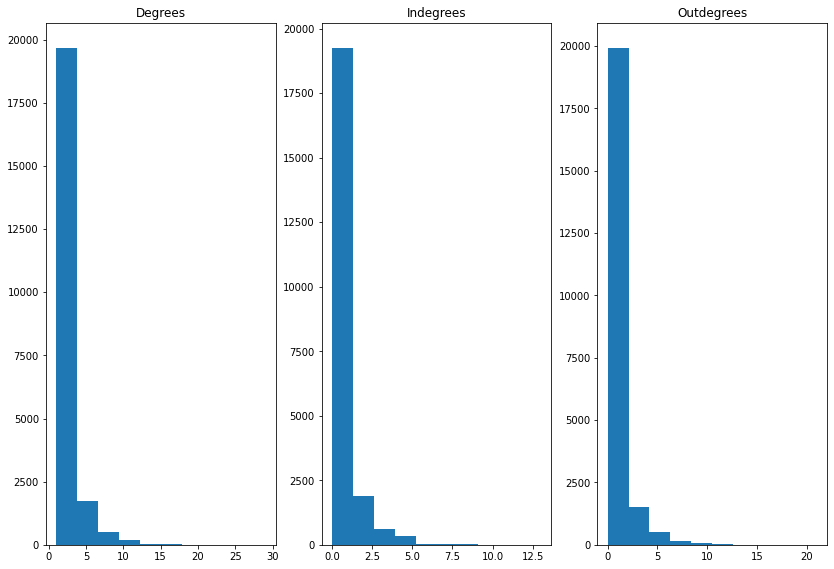

In [15]:
# --------------------- Degree distribution ---------------------------------------
#
degrees = []
in_degrees = []
out_degrees = []
for G in graphs:
    deg = [G.degree(n) for n in G.nodes()]
    degrees.extend(deg)
    outdeg = [G.out_degree(n) for n in G.nodes()]
    out_degrees.extend(outdeg)
    indeg = [G.in_degree(n) for n in G.nodes()]
    in_degrees.extend(indeg)

# Plot
fig = plt.figure(figsize=(14, 9.6))
ax = plt.subplot(1, 3, 1)
plt.hist(degrees)
plt.title('Degrees')
ax = plt.subplot(1, 3, 2)
plt.hist(in_degrees)
plt.title('Indegrees')
ax = plt.subplot(1, 3, 3)
plt.hist(out_degrees)
plt.title('Outdegrees')
# Save figure
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'DegreeDistribution_' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

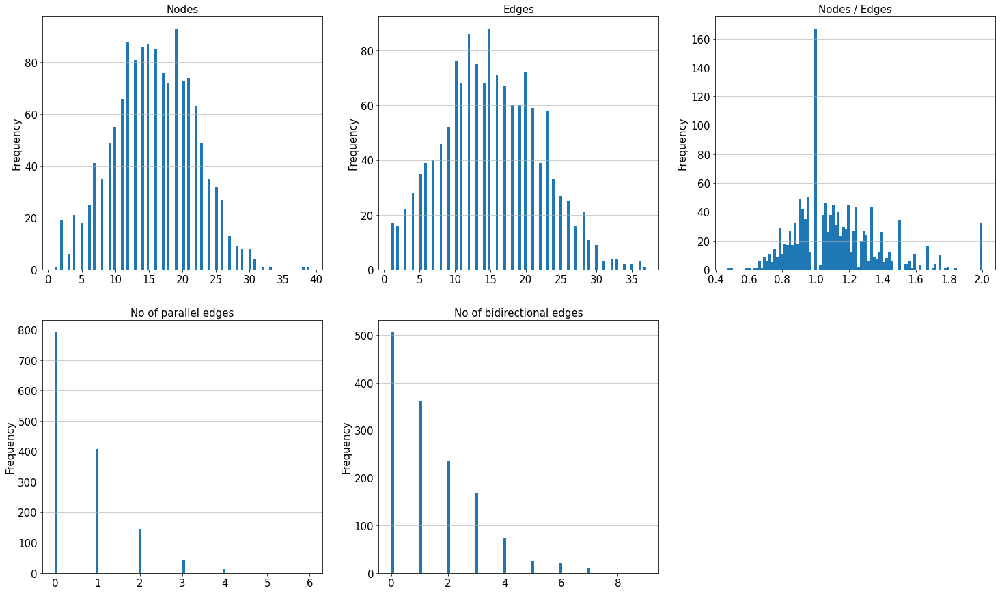

In [35]:

# ----------- Histogram: Nodes, Edges, Node-Edge ratio, Parallel edges -----------
# Set up the plot
fig = plt.figure(figsize=(25, 15))
# Nodes
ax = plt.subplot(2, 3, 1)
plt.hist(df.nodes, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Nodes', fontsize=15)
# Edges
ax = plt.subplot(2, 3, 2)
plt.hist(df.edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Edges', fontsize=15)
# Histogram Nodes/Edges ratio
ax = plt.subplot(2, 3, 3)
plt.hist(df.nodes / df.edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('Nodes / Edges', fontsize=15)
# Parallel edges
ax = plt.subplot(2, 3, 4)
plt.hist(df.parallel_edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('No of parallel edges', fontsize=15)
# Bidirectional edges
ax = plt.subplot(2, 3, 5)
plt.hist(df.bidirectional_edges, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.title('No of bidirectional edges', fontsize=15)
# Save
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_LCC-LSC_TAT' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

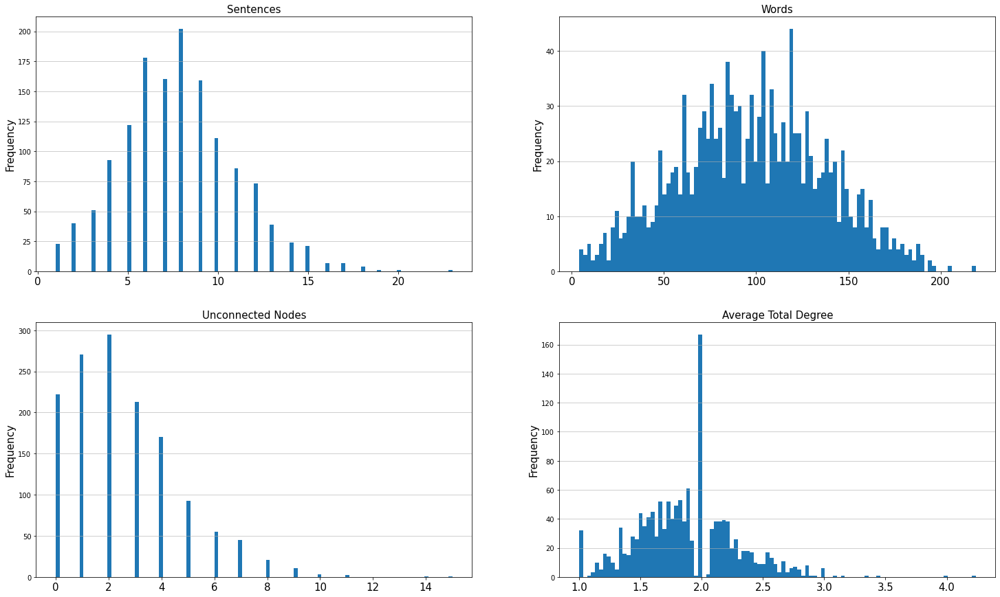

In [18]:

# ----------- Histogram -----------
# Sentences, Words, Unconnected Nodes, Average Total Degree,
fig = plt.figure(figsize=(25, 15))
# Sentences
ax = plt.subplot(2, 2, 1)
plt.hist(df.sentences, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Sentences', fontsize=15)
#
# Words
ax = plt.subplot(2, 2, 2)
plt.hist(df.words, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Words', fontsize=15)
#
# Unconnected Nodes
ax = plt.subplot(2, 2, 3)
plt.hist(df.unconnected, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Unconnected Nodes', fontsize=15)
#
# Average Total Degree
ax = plt.subplot(2, 2, 4)
plt.hist(df.average_total_degree, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Average Total Degree [(n_edges * 2) / n_nodes]', fontsize=15)
#
# Save figure
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_Basics' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

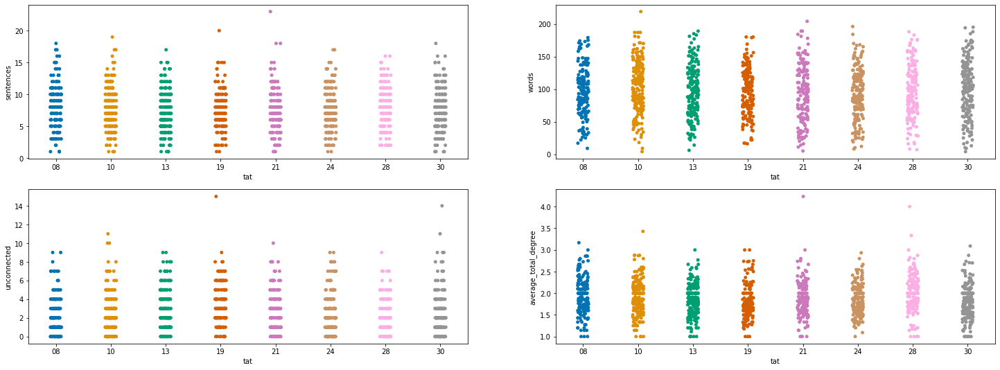

In [19]:
# ----------- stripplot for each TAT -----------
# Sentences, Words, Unconnected Nodes, Average Total Degree,
fig = plt.figure(figsize=(25, 9))
ax = plt.subplot(2, 2, 1)
sns.stripplot(y='sentences', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 2)
sns.stripplot(y='words', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 3)
sns.stripplot(y='unconnected', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 4)
sns.stripplot(y='average_total_degree', x='tat',
              data=df,
              palette="colorblind",
              )

output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_TAT_Basics' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

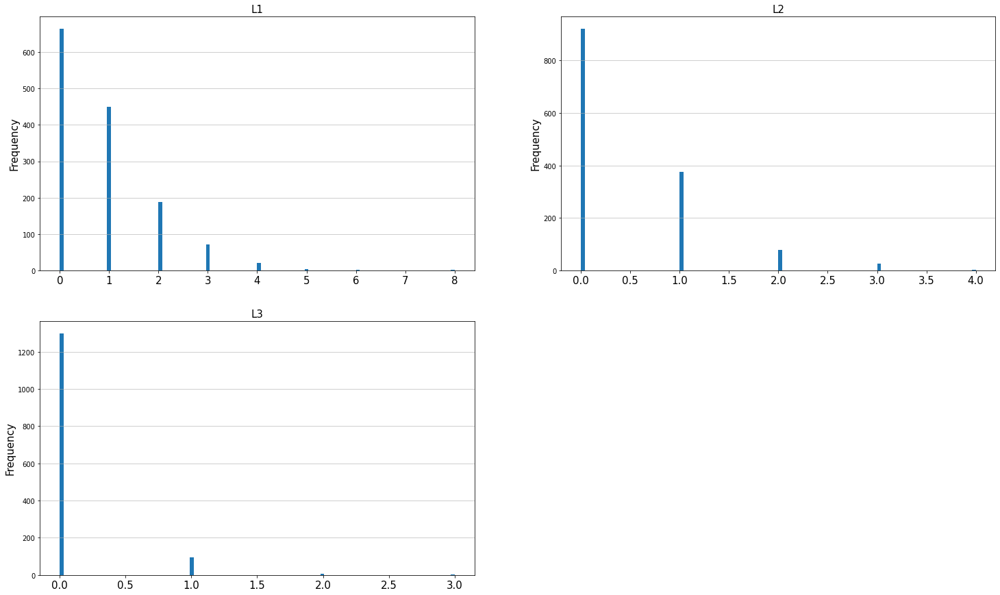

In [20]:
# ----------- Histogram -----------
# L1, L2, L3
fig = plt.figure(figsize=(25, 15))
# L1
ax = plt.subplot(2, 2, 1)
plt.hist(df.L1, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L1', fontsize=15)
#
# L2
ax = plt.subplot(2, 2, 2)
plt.hist(df.L2, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L2', fontsize=15)
#
# L3
ax = plt.subplot(2, 2, 3)
plt.hist(df.L3, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('L3', fontsize=15)
#
# Save figure
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_L' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

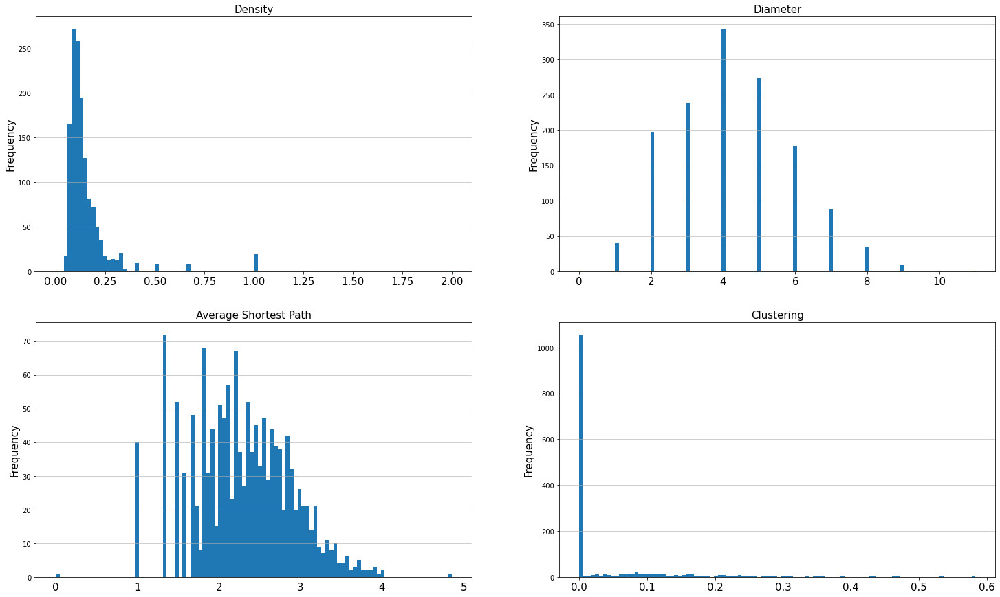

In [21]:
# ----------- Histogram -----------
# Density, Diameter, Average Shortest Path, Clustering,
fig = plt.figure(figsize=(25, 15))
# Density
ax = plt.subplot(2, 2, 1)
plt.hist(df.density, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Density', fontsize=15)
#
# Diameter
ax = plt.subplot(2, 2, 2)
plt.hist(df.diameter, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Diameter', fontsize=15)
#
# Average Shortest Path
ax = plt.subplot(2, 2, 3)
plt.hist(df.average_shortest_path, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Average Shortest Path', fontsize=15)
#
# Clustering
ax = plt.subplot(2, 2, 4)
plt.hist(df.clustering, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Clustering', fontsize=15)
#
# Save figure
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_UndirectedGraphProperties' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

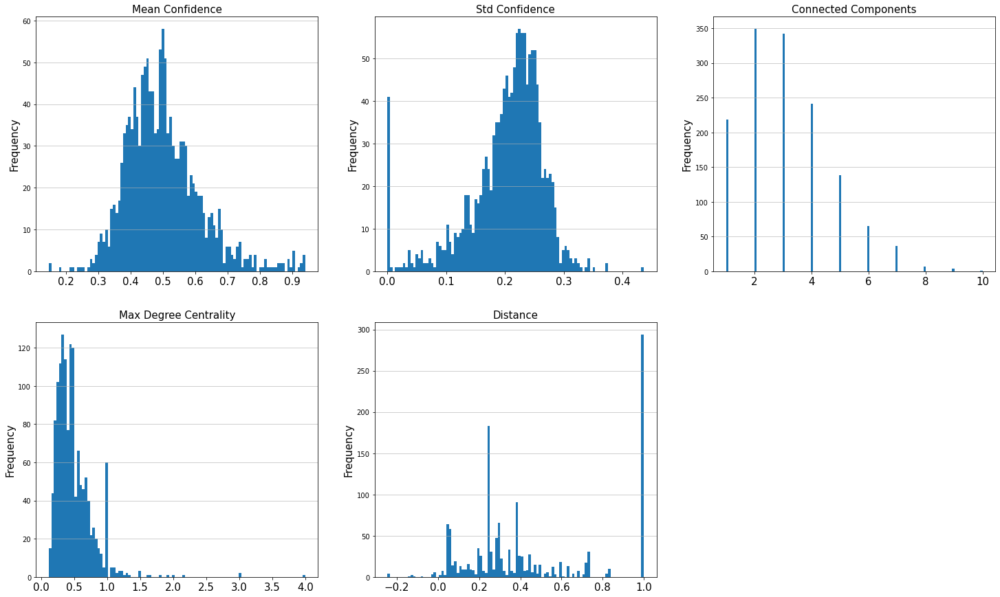

In [22]:

# ----------- Histogram -----------
# Mean Confidence, Std Confidence, Connected Components, Max Degree Centrality, Distance
fig = plt.figure(figsize=(25, 15))
# Mean Confidence
ax = plt.subplot(2, 3, 1)
plt.hist(df.mean_confidence[~np.isnan(df.mean_confidence)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Mean Confidence', fontsize=15)
#
# Std Confidence
ax = plt.subplot(2, 3, 2)
plt.hist(df.std_confidence[~np.isnan(df.std_confidence)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Std Confidence', fontsize=15)
#
# Connected Components
ax = plt.subplot(2, 3, 3)
plt.hist(df.connected_components, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Connected Components', fontsize=15)
#
# Max Degree Centrality
ax = plt.subplot(2, 3, 4)
plt.hist(df.max_degree_centrality, bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Max Degree Centrality', fontsize=15)
#
# Distance
ax = plt.subplot(2, 3, 5)
plt.hist(df.distance[~np.isnan(df.distance)], bins=100)
plt.grid(axis='y', alpha=0.75)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.title('Distance', fontsize=15)
# Save figure
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

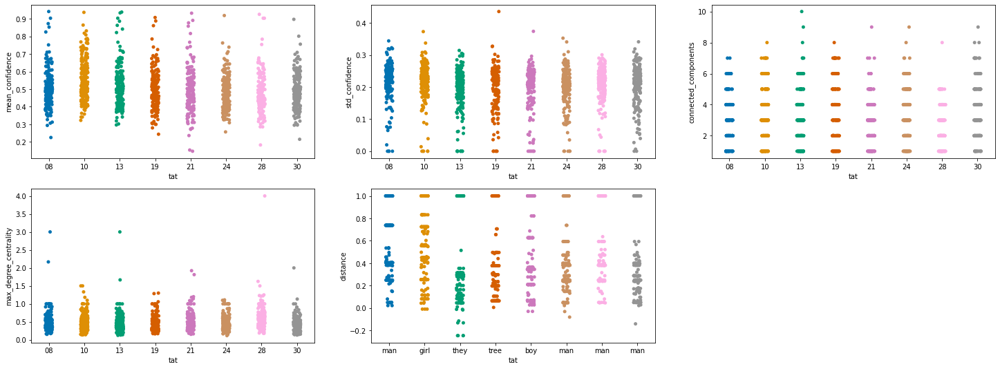

In [23]:
# ----------- stripplot for each TAT -----------
# Mean Confidence, Std Confidence, Connected Components, Max Degree Centrality, Distance
fig = plt.figure(figsize=(25, 9))
ax = plt.subplot(2, 3, 1)
sns.stripplot(y='mean_confidence', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 3, 2)
sns.stripplot(y='std_confidence', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 3, 3)
sns.stripplot(y='connected_components', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 3, 4)
sns.stripplot(y='max_degree_centrality', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 3, 5)
sns.stripplot(y='distance', x='tat',
              data=df,
              palette="colorblind",
              )
ax.set_xticklabels(frequent_words)

output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_TAT_noTicks' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

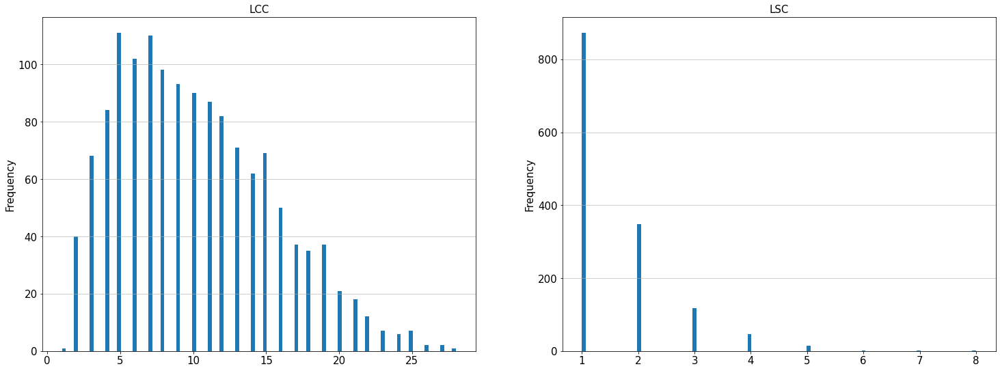

In [24]:

# ----------- Hist -----------
# LCC & LSC
fig = plt.figure(figsize=(25, 9))
# ---- LCC ----
# Set up the plot
ax = plt.subplot(1, 2, 1)
plt.hist(df.lcc, bins=100)
plt.grid(axis='y', alpha=0.75)
# plt.xlabel('Nodes', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('LCC', fontsize=15)
# ---- LSC ----
# Set up the plot
ax = plt.subplot(1, 2, 2)
plt.hist(df.lsc, bins=100)
plt.grid(axis='y', alpha=0.75)
# plt.xlabel('Nodes', fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel('Frequency', fontsize=15)
plt.title('LSC', fontsize=15)
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_LCC-LSC' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

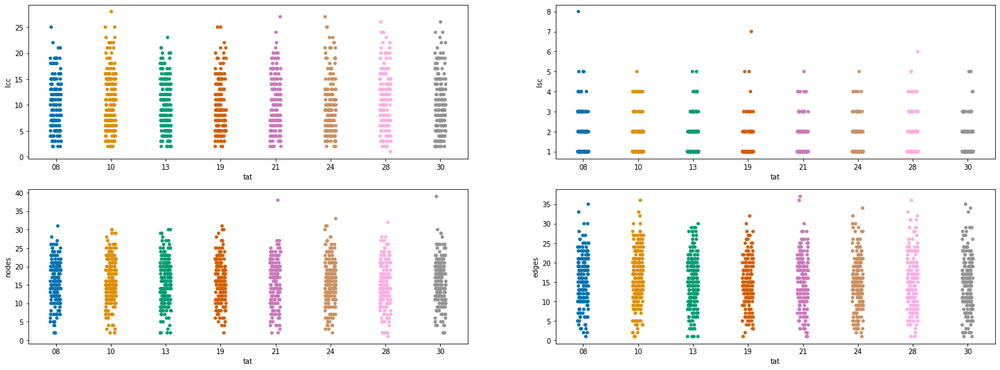

In [25]:
# ----------- LCC, LSC, Nodes, Edges by TAT -----------
fig = plt.figure(figsize=(25, 9))
ax = plt.subplot(2, 2, 1)
sns.stripplot(y='lcc', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 2)
sns.stripplot(y='lsc', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 3)
sns.stripplot(y='nodes', x='tat',
              data=df,
              palette="colorblind",
              )
ax = plt.subplot(2, 2, 4)
sns.stripplot(y='edges', x='tat',
              data=df,
              palette="colorblind",
              )
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Hist_LCC-LSC_TAT' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

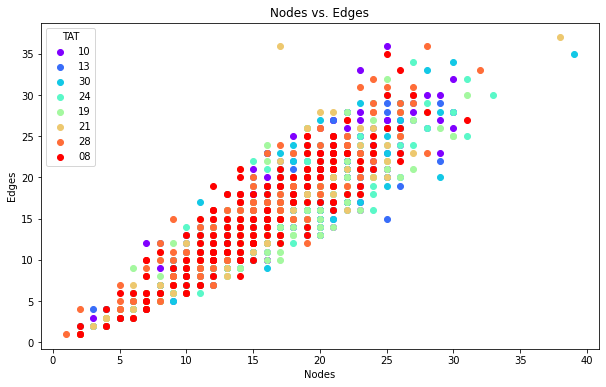

In [26]:

# ----------- Plot nodes vs edges -----------
fig, ax = plt.subplots(figsize=(10, 6))
tats = df.tat.unique()
colors = cm.rainbow(np.linspace(0, 1, len(tats)))
for t, c in zip(tats, colors):
    plt.scatter(df[df.tat == t].nodes, df[df.tat == t].edges, color=c, label=t)

ax.legend(title="TAT")
plt.title('Nodes vs. Edges')
plt.xlabel('Nodes')
plt.ylabel('Edges')
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'Nodes_vs_Edges' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show(block=False)

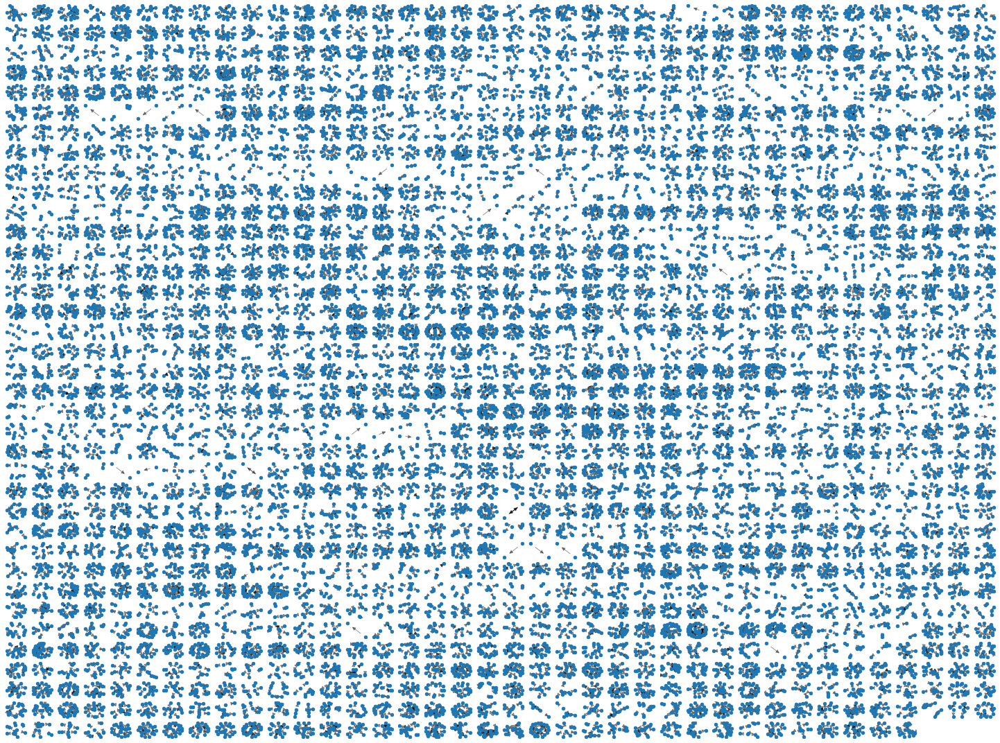

In [31]:
# --------------------- Raster Plot of all Graphs ---------------------------------------
fig = plt.figure(figsize=(25.6, 20))
for g, G in enumerate(graphs):
    ax = plt.subplot(np.ceil(np.sqrt(len(graphs))), np.ceil(np.sqrt(len(graphs))), g + 1)
    pos = nx.spring_layout(G)
    plt.axis("off")
    nx.draw_networkx_nodes(G, pos, node_size=20)
    nx.draw_networkx_edges(G, pos, alpha=0.4)

# --- Optional: Save plot --- 
output_dir = '/Users/CN/Dropbox/speech_graphs/all_tats/figures/'
output = op.join(output_dir, 'GraphsRaster_' +
                 '_{0}'.format(str(datetime.date.today())))
plt.savefig(output)
plt.show()